# Customer Retention Case Study with detailed data analysis

### E-retail factors for customer activation and retention: A case study from Indian e-commerce customers

Customer satisfaction has emerged as one of the most important factors that guarantee the success of online store; it has been posited as a key stimulant of purchase or repurchase intentions and customer loyalty. A comprehensive review of the literature, theories and models have been carried out to propose the models for customer activation and customer retention. Five major factors that contributed to the success of an e-commerce store have been identified as: service quality, system quality, information quality, trust and net benefit. The research furthermore investigated the factors that influence the online customers repeat purchase intention. The combination of both utilitarian value and hedonistic values are needed to affect the repeat purchase intention (loyalty) positively. The data is collected from the Indian online shoppers. Results indicate the e-retail success factors, which are very much critical for customer satisfaction. This is also represented in the use case diagram below.

# Importing Libraries

In [43]:
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")
import missingno
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import OrdinalEncoder

# Importing Data

In [5]:
df = pd.read_excel(r"C:\Users\Shreyasi  Saha\Downloads/customer_retention_dataset.xlsx")
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,Male,31-40 years,Delhi,110009,Above 4 years,31-40 times,Dial-up,Desktop,Others,Window/windows Mobile,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,Female,21-30 years,Delhi,110030,Above 4 years,41 times and above,Wi-Fi,Smartphone,4.7 inches,IOS/Mac,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,Female,21-30 years,Greater Noida,201308,3-4 years,41 times and above,Mobile Internet,Smartphone,5.5 inches,Android,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,Male,21-30 years,Karnal,132001,3-4 years,Less than 10 times,Mobile Internet,Smartphone,5.5 inches,IOS/Mac,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,Female,21-30 years,Bangalore,530068,2-3 years,11-20 times,Wi-Fi,Smartphone,4.7 inches,IOS/Mac,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,Female,21-30 years,Solan,173212,1-2 years,Less than 10 times,Mobile Internet,Smartphone,5.5 inches,Android,...,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in
265,Female,31-40 years,Ghaziabad,201008,1-2 years,31-40 times,Mobile Internet,Smartphone,Others,Android,...,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com
266,Female,41-50 yaers,Bangalore,560010,2-3 years,Less than 10 times,Mobile internet,Laptop,Others,Window/windows Mobile,...,Amazon.in,Snapdeal.com,Amazon.in,Snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Amazon.in
267,Female,Less than 20 years,Solan,173229,2-3 years,Less than 10 times,Wi-Fi,Smartphone,5.5 inches,Android,...,Amazon.in,"Amazon.in, Myntra.com, Snapdeal.com",Amazon.in,"Amazon.in, Snapdeal.com",Amazon.in,Amazon.in,Amazon.in,"Myntra.com, Snapdeal.com","Myntra.com, Snapdeal.com",Amazon.in


# Exploratory Data Analysis (EDA)

#### _creating a new dataframe with the columns renamed to something more concise_

In [7]:
df.columns

Index(['1Gender of respondent', '2 How old are you? ',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ',
       '13 After first visit, how 

# Rename Columns

Using `columns` we can see all the 71 column names from the datasheet page.

In [8]:
df.rename(columns = {'1Gender of respondent':'Gender', 
       '2 How old are you? ':'Age',
       '3 Which city do you shop online from?':'City',
       '4 What is the Pin Code of where you shop online from?':'Pin Code',
       '5 Since How Long You are Shopping Online ?':'Online Shopping Duration',
       '6 How many times you have made an online purchase in the past 1 year?':'Online purchase in past 1 year',
       '7 How do you access the internet while shopping on-line?':'Mode of internet access',
       '8 Which device do you use to access the online shopping?':'Device used for internet access',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ':'Screen size of mobile',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ':'Operating System',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ':'Browser',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ':'Channel used for 1st visit',
       '13 After first visit, how do you reach the online retail store?\t\t\t\t                                                   ':'Online store access post 1st visit',
       '14 How much time do you explore the e- retail store before making a purchase decision?                                                                   ':'Time invested to explore and purchase',
       '15 What is your preferred payment Option?\t\t\t\t\t                                                                                                                               ':'Preferred payment option',
       '16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ':'Frequency to abandon purchase from a cart',
       '17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t                                                                                                                                                       ':'Reason to abandon purchase from a cart',
       '18 The content on the website must be easy to read and understand':'Shopping website content readability',
       '19 Information on similar product to the one highlighted  is important for product comparison':'Importance of product comparison content',
       '20 Complete information on listed seller and product being offered is important for purchase decision.':'Importance of seller and product detail for purchase decision',
       '21 All relevant information on listed products must be stated clearly':'Clarity on relevant information for products',
       '22 Ease of navigation in website':'Ease of navigation on website', 
       '23 Loading and processing speed':'Loading and processing speed of website',
       '24 User friendly Interface of the website':'Ease of access on GUI of website',
       '25 Convenient Payment methods':'Convenient/Most used payment methods',
       '26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time':'On time product delivery',
       '27 Empathy (readiness to assist with queries) towards the customers':'Empathy towards the customer',
       '28 Being able to guarantee the privacy of the customer':'Privacy guarantee of the customer',
       '29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)':'Support availability via various means',
       '30 Online shopping gives monetary benefit and discounts':'Offers and Discounts on online shopping',
       '31 Enjoyment is derived from shopping online':'Enjoyment quotient in online shopping',
       '32 Shopping online is convenient and flexible':'Flexibity in online shopping',
       '33 Return and replacement policy of the e-tailer is important for purchase decision':'Return and Replacement policy',
       '34 Gaining access to loyalty programs is a benefit of shopping online':'Loyalty program benefits',
       '35 Displaying quality Information on the website improves satisfaction of customers':'Quality of website content',
       '36 User derive satisfaction while shopping on a good quality website or application':'User satisfaction',
       '37 Net Benefit derived from shopping online can lead to users satisfaction':'Net benefit',
       '38 User satisfaction cannot exist without trust':'User satisfaction with trust factor',
       '39 Offering a wide variety of listed product in several category':'Wide range of products',
       '40 Provision of complete and relevant product information':'Relevance in product details',
       '41 Monetary savings':'Monetary savings',
       '42 The Convenience of patronizing the online retailer':'Frequency of purchase from a seller',
       '43 Shopping on the website gives you the sense of adventure':'Sense of adventure',
       '44 Shopping on your preferred e-tailer enhances your social status':'Social status',
       '45 You feel gratification shopping on your favorite e-tailer':'Pleasure in shopping from a seller',
       '46 Shopping on the website helps you fulfill certain roles':'Fulfill roles from shopping',
       '47 Getting value for money spent':'Value for money',
       'From the following, tick any (or all) of the online retailers you have shopped from;                                                                           ':'List of online shopping websites',
       'Easy to use website or application':'Ease of access on an online website',
       'Visual appealing web-page layout':'Website layout', 
       'Wild variety of product on offer':'Variety of products on offer',
       'Complete, relevant description information of products':'Completeness of product description',
       'Fast loading website speed of website and application':'Website access speed',
       'Reliability of the website or application':'Reliability of website',
       'Quickness to complete purchase':'Ease to complete purchase',
       'Availability of several payment options':'Payment option availability', 
       'Speedy order delivery ':'Fast delivery',
       'Privacy of customers’ information':'Customer privacy',
       'Security of customer financial information':'Security on payment details',
       'Perceived Trustworthiness':'Trust worthiness',
       'Presence of online assistance through multi-channel':'Online presence of support team',
       'Longer time to get logged in (promotion, sales period)':'Time to login website on special offer days',
       'Longer time in displaying graphics and photos (promotion, sales period)':'Time to load media on special offer days',
       'Late declaration of price (promotion, sales period)':'Delay in declaring special offer details',
       'Longer page loading time (promotion, sales period)':'Time to load website on special offer days',
       'Limited mode of payment on most products (promotion, sales period)':'Limited mode of payment on special offer days',
       'Longer delivery period':'Delayed product delivery', 
       'Change in website/Application design':'Change in GUI',
       'Frequent disruption when moving from one page to another':'Issue accessing multiple pages of a website',
       'Website is as efficient as before':'Efficiency of website at all times',
       'Which of the Indian online retailer would you recommend to a friend?':'Recommendation quotient'},
           inplace = True)

In [9]:
print("We have {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))
df.head()

We have 269 Rows and 71 Columns in our dataframe


,Gender,Age,City,Pin Code,Online Shopping Duration,Online purchase in past 1 year,Mode of internet access,Device used for internet access,Screen size of mobile,Operating System,...,Time to login website on special offer days,Time to load media on special offer days,Delay in declaring special offer details,Time to load website on special offer days,Limited mode of payment on special offer days,Delayed product delivery,Change in GUI,Issue accessing multiple pages of a website,Efficiency of website at all times,Recommendation quotient
0,Male,31-40 years,Delhi,110009,Above 4 years,31-40 times,Dial-up,Desktop,Others,Window/windows Mobile,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,Female,21-30 years,Delhi,110030,Above 4 years,41 times and above,Wi-Fi,Smartphone,4.7 inches,IOS/Mac,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,Female,21-30 years,Greater Noida,201308,3-4 years,41 times and above,Mobile Internet,Smartphone,5.5 inches,Android,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,Male,21-30 years,Karnal,132001,3-4 years,Less than 10 times,Mobile Internet,Smartphone,5.5 inches,IOS/Mac,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,Female,21-30 years,Bangalore,530068,2-3 years,11-20 times,Wi-Fi,Smartphone,4.7 inches,IOS/Mac,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"


first 5 rows of our datasheet data frame after renaming the column names.

In [10]:
df.isna().sum() # checking for missing values

Gender                                         0
Age                                            0
City                                           0
Pin Code                                       0
Online Shopping Duration                       0
                                              ..
Delayed product delivery                       0
Change in GUI                                  0
Issue accessing multiple pages of a website    0
Efficiency of website at all times             0
Recommendation quotient                        0
Length: 71, dtype: int64

No null values are present

Using the `isna` and `sum` fuctions together on our dataframe we can take a look at missing data information. It looks like we do not have any missing values present in any of our columns. However we can confirm the same with visual on it.

In [12]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Gender,269,2,Female,181,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,269,5,31-40 years,81,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,269,11,Delhi,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Pin Code,269.0,NaN,NaN,NaN,220465.747212,140524.341051,110008.0,122018.0,201303.0,201310.0,560037.0
Online Shopping Duration,269,5,Above 4 years,98,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
Delayed product delivery,269,6,Paytm.com,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Change in GUI,269,7,Amazon.in,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Issue accessing multiple pages of a website,269,8,Amazon.in,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Efficiency of website at all times,269,8,Amazon.in,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df.info() # checking the datatype information on columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                         Non-Null Count  Dtype 
---  ------                                                         --------------  ----- 
 0   Gender                                                         269 non-null    object
 1   Age                                                            269 non-null    object
 2   City                                                           269 non-null    object
 3   Pin Code                                                       269 non-null    int64 
 4   Online Shopping Duration                                       269 non-null    object
 5   Online purchase in past 1 year                                 269 non-null    object
 6   Mode of internet access                                        269 non-null    object
 7   Device used for internet access                                269 non-

In [14]:
df.nunique().to_frame("Unique Values")

,Unique Values
Gender,2
Age,5
City,11
Pin Code,39
Online Shopping Duration,5
...,...
Delayed product delivery,6
Change in GUI,7
Issue accessing multiple pages of a website,8
Efficiency of website at all times,8


In [17]:
object_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'O':
        object_datatype.append(x)
object_datatype

['Gender',
 'Age',
 'City',
 'Online Shopping Duration',
 'Online purchase in past 1 year',
 'Mode of internet access',
 'Device used for internet access',
 'Screen size of mobile',
 'Operating System',
 'Browser',
 'Channel used for 1st visit',
 'Online store access post 1st visit',
 'Time invested to explore and purchase',
 'Preferred payment option',
 'Frequency to abandon purchase from a cart',
 'Reason to abandon purchase from a cart',
 'Shopping website content readability',
 'Importance of product comparison content',
 'Importance of seller and product detail for purchase decision',
 'Clarity on relevant information for products',
 'Ease of navigation on website',
 'Loading and processing speed of website',
 'Ease of access on GUI of website',
 'Convenient/Most used payment methods',
 'On time product delivery',
 'Empathy towards the customer',
 'Privacy guarantee of the customer',
 'Support availability via various means',
 'Offers and Discounts on online shopping',
 'Enjoyment

In [19]:
for col in object_datatype:
    print(col)
    print(df[col].value_counts())
    print("="*120)

Gender
Female    181
Male       88
Name: Gender, dtype: int64
Age
31-40 years           81
21-30 years           79
41-50 yaers           70
Less than 20 years    20
51 years and above    19
Name: Age, dtype: int64
City
Delhi            58
Greater Noida    43
Noida            40
Bangalore        37
Karnal           27
Solan            18
Ghaziabad        18
Gurgaon          12
Merrut            9
Moradabad         5
Bulandshahr       2
Name: City, dtype: int64
Online Shopping Duration
Above 4 years       98
2-3 years           65
3-4 years           47
Less than 1 year    43
1-2 years           16
Name: Online Shopping Duration, dtype: int64
Online purchase in past 1 year
Less than 10 times    114
31-40 times            63
41 times and above     47
11-20 times            29
21-30 times            10
42 times and above      6
Name: Online purchase in past 1 year, dtype: int64
Mode of internet access
Mobile internet    142
Wi-Fi               76
Mobile Internet     47
Dial-up            

# Data Visualization

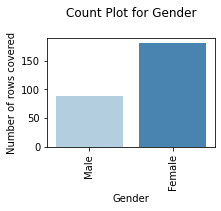

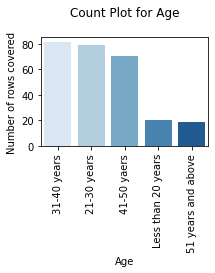

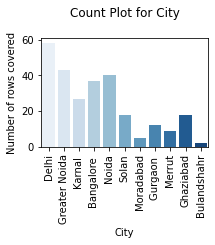

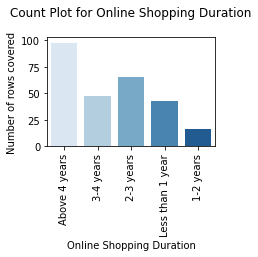

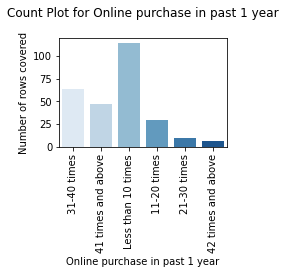

...

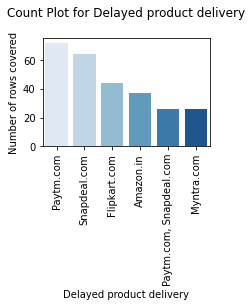

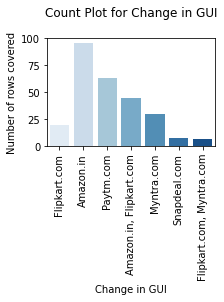

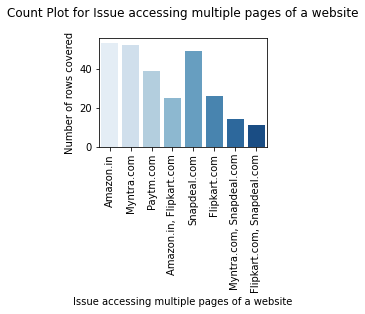

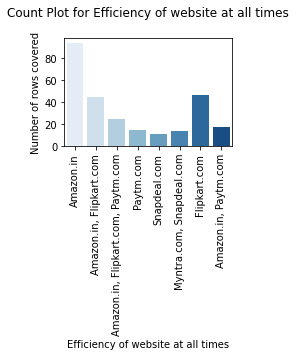

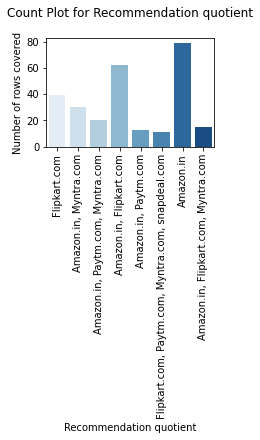

In [36]:
rfor col in df[object_datatype]:
    plt.figure(figsize=(3,2))
    col_name = col
    values = df[col_name].value_counts()
    index = 0
    ax = sns.countplot(df[col_name], palette="Blues")

    for i in ax.patches:
        h = i.get_height() # getting the count of each value
        t = len(df[col_name]) # getting the total number of records using length
        index += 1
    
    plt.title(f"Count Plot for {col_name}\n")
    plt.xlabel(col_name)
    plt.ylabel(f"Number of rows covered")
    plt.xticks(rotation=90)
    plt.show()

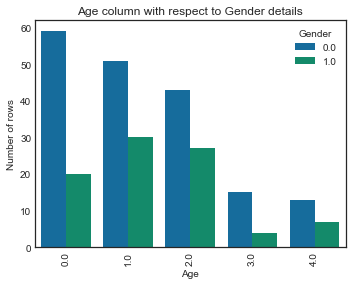

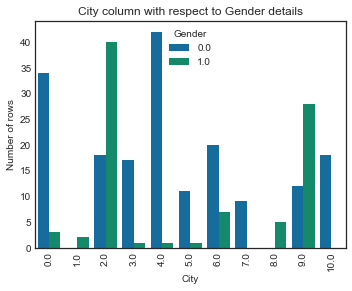

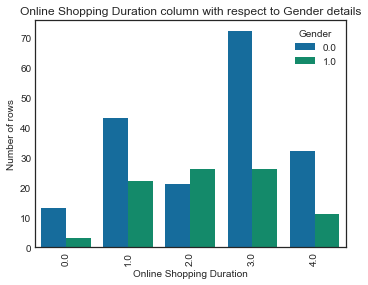

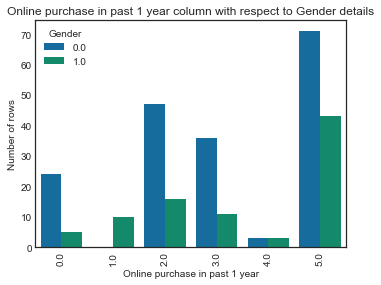

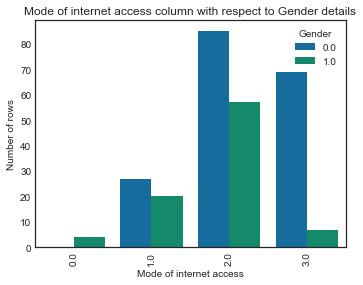

...

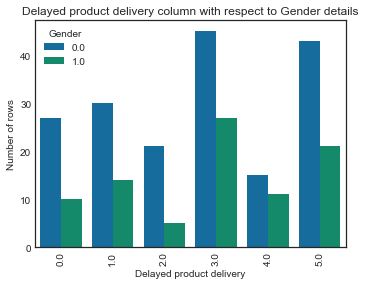

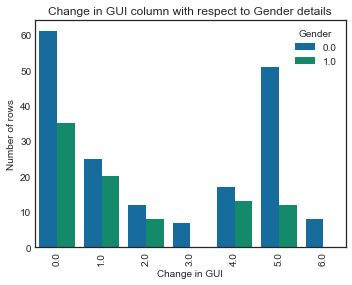

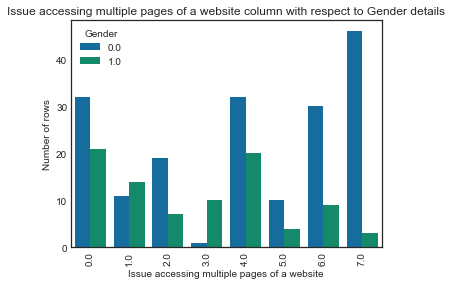

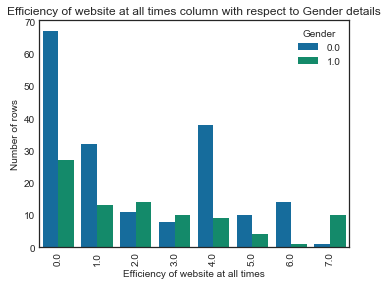

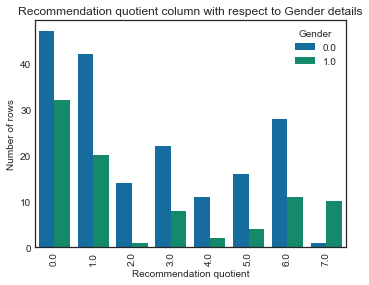

In [62]:
for col in df:
    if col == "Gender":
        pass
    elif col == "Pin Code":
        pass
    else:
        plt.style.use('seaborn-white')
        plt.figure(figsize=(5,4))
        sns.countplot(x=col, data=df, hue="Gender")
        plt.title("{} column with respect to Gender details".format(col))
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.ylabel("Number of rows")
        plt.show()

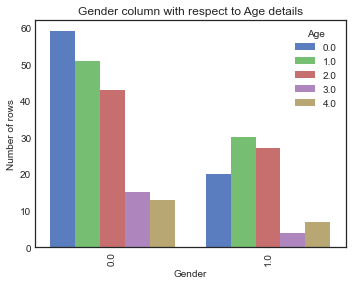

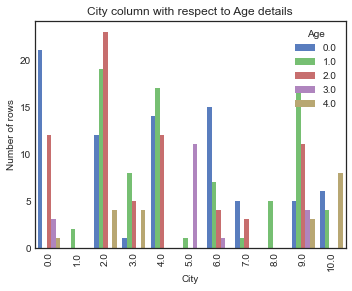

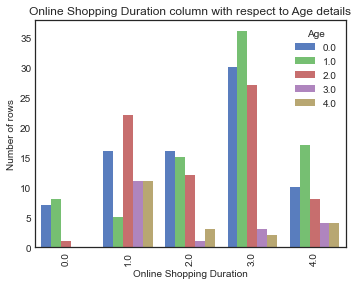

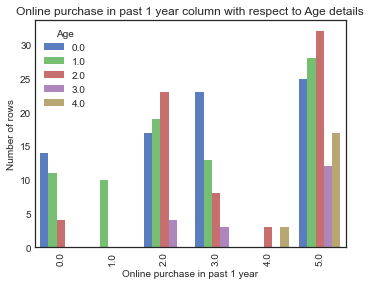

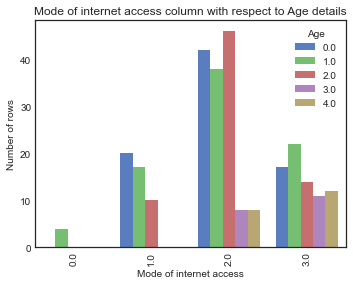

...

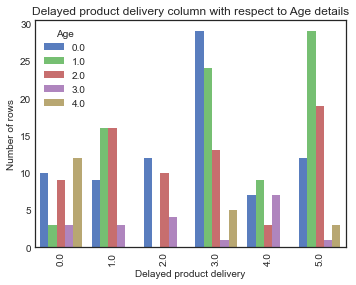

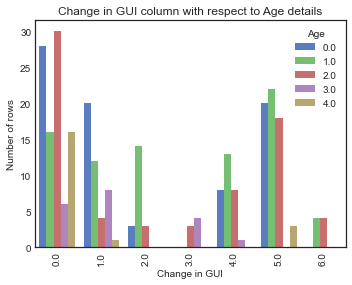

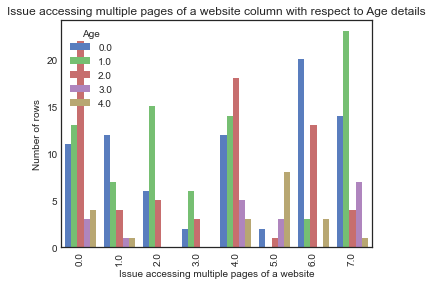

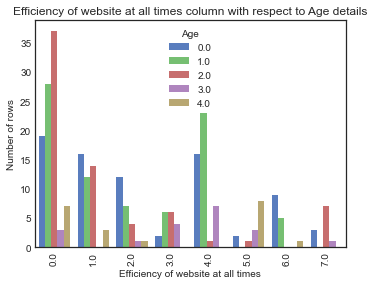

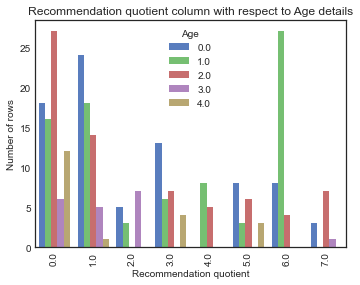

In [63]:
for col in df:
    if col == "Age":
        pass
    elif col == "Pin Code":
        pass
    else:
        plt.style.use('seaborn-muted')
        plt.figure(figsize=(5,4))
        sns.countplot(x=col, data=df, hue="Age")
        plt.title("{} column with respect to Age details".format(col))
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.ylabel("Number of rows")
        plt.show()

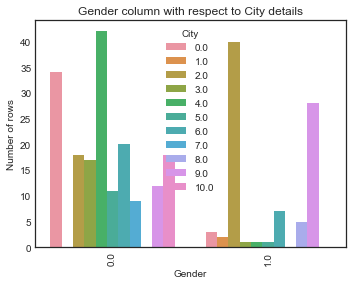

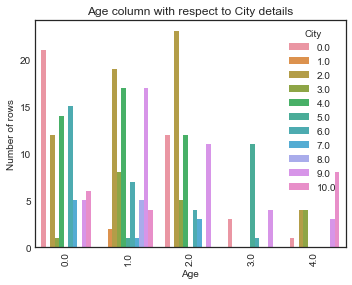

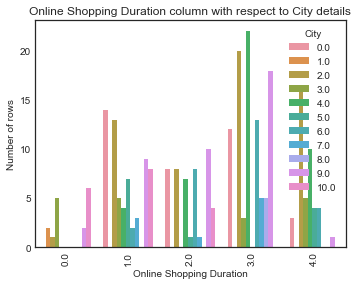

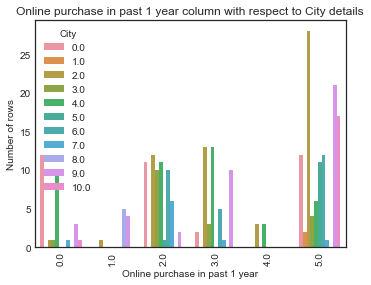

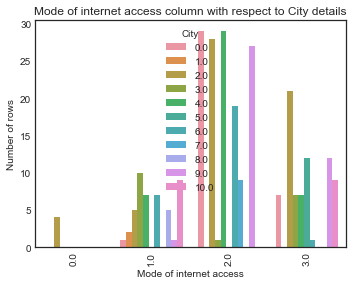

...

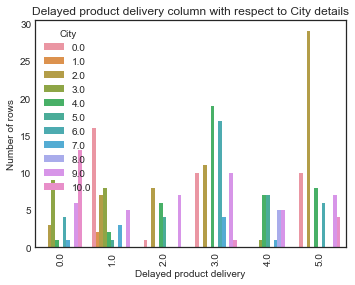

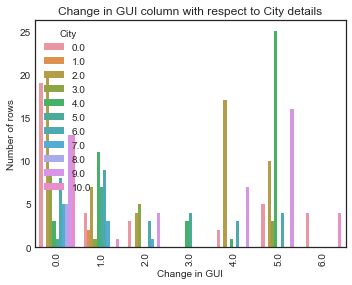

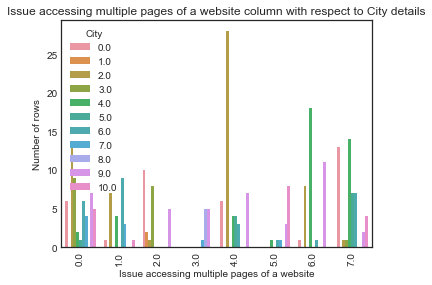

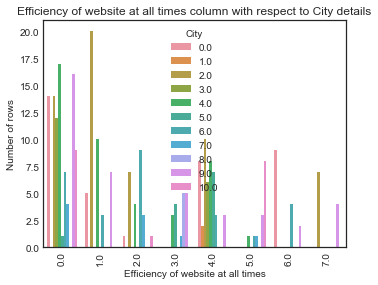

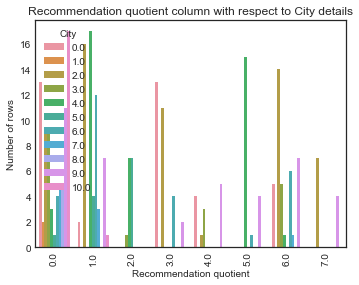

In [64]:
for col in df:
    if col == "City":
        pass
    elif col == "Pin Code":
        pass
    else:
        plt.style.use('seaborn-colorblind')
        plt.figure(figsize=(5,4))
        sns.countplot(x=col, data=df, hue="City")
        plt.title("{} column with respect to City details".format(col))
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.ylabel("Number of rows")
        plt.show()

# Encoding the categorical object datatype columns

In [65]:
# Ordinal Encoding

oe = OrdinalEncoder()

def ordinal_encode(df, column):
    df[column] = oe.fit_transform(df[column])
    return df

oe_col = df.columns
df=ordinal_encode(df, oe_col)
df.head()

,Gender,Age,City,Pin Code,Online Shopping Duration,Online purchase in past 1 year,Mode of internet access,Device used for internet access,Screen size of mobile,Operating System,...,Time to login website on special offer days,Time to load media on special offer days,Delay in declaring special offer details,Time to load website on special offer days,Limited mode of payment on special offer days,Delayed product delivery,Change in GUI,Issue accessing multiple pages of a website,Efficiency of website at all times,Recommendation quotient
0,1.0,1.0,2.0,1.0,3.0,2.0,0.0,0.0,3.0,2.0,...,0.0,0.0,3.0,5.0,0.0,3.0,2.0,0.0,0.0,6.0
1,0.0,0.0,2.0,5.0,3.0,3.0,3.0,2.0,0.0,1.0,...,1.0,6.0,7.0,10.0,7.0,5.0,0.0,4.0,1.0,3.0
2,0.0,0.0,4.0,23.0,2.0,3.0,1.0,2.0,2.0,0.0,...,7.0,6.0,4.0,7.0,0.0,3.0,5.0,6.0,0.0,5.0
3,1.0,0.0,6.0,11.0,2.0,5.0,1.0,2.0,2.0,1.0,...,9.0,7.0,4.0,8.0,5.0,3.0,1.0,1.0,2.0,1.0
4,0.0,0.0,0.0,31.0,1.0,0.0,3.0,2.0,0.0,1.0,...,5.0,8.0,5.0,8.0,7.0,3.0,0.0,7.0,6.0,3.0


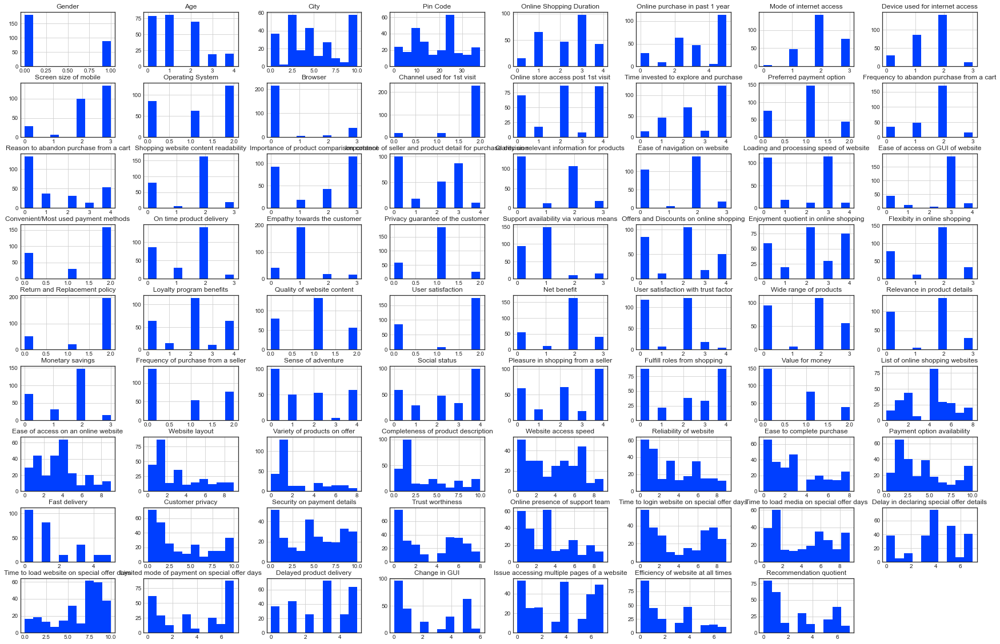

In [71]:
plt.style.use('seaborn-bright')

df.hist(figsize=(30,20))
plt.show()

In [ ]:
plt.figure(figsize=(10,10))
sns.pairplot(df)
plt.show()

# Correlation using a Heatmap

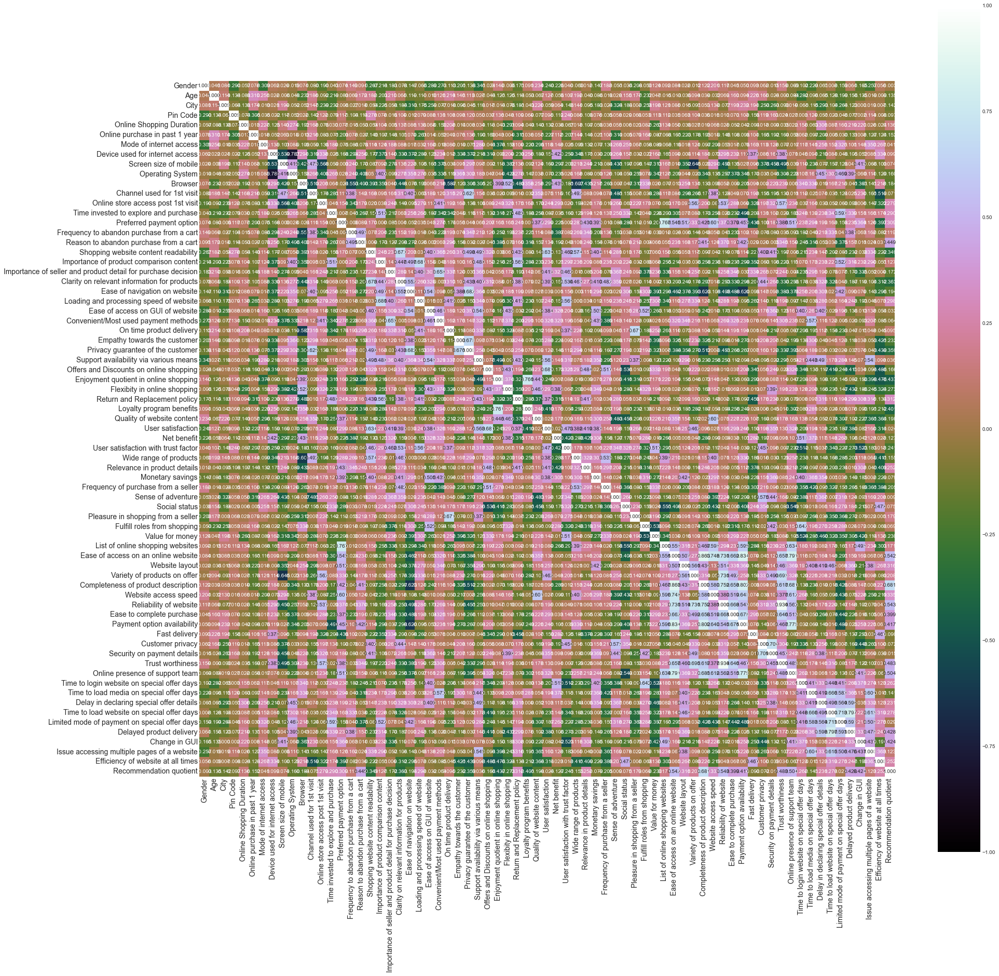

In [55]:
upper_triangle = np.triu(df.corr())
plt.figure(figsize=(30,30))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', annot_kws={'size':10}, cmap="cubehelix")
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

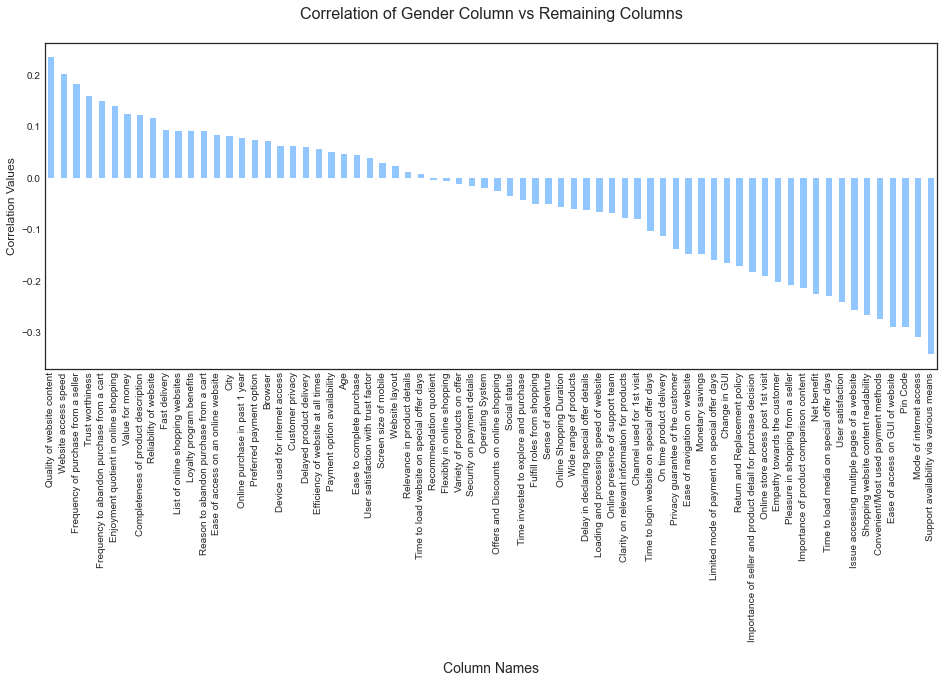

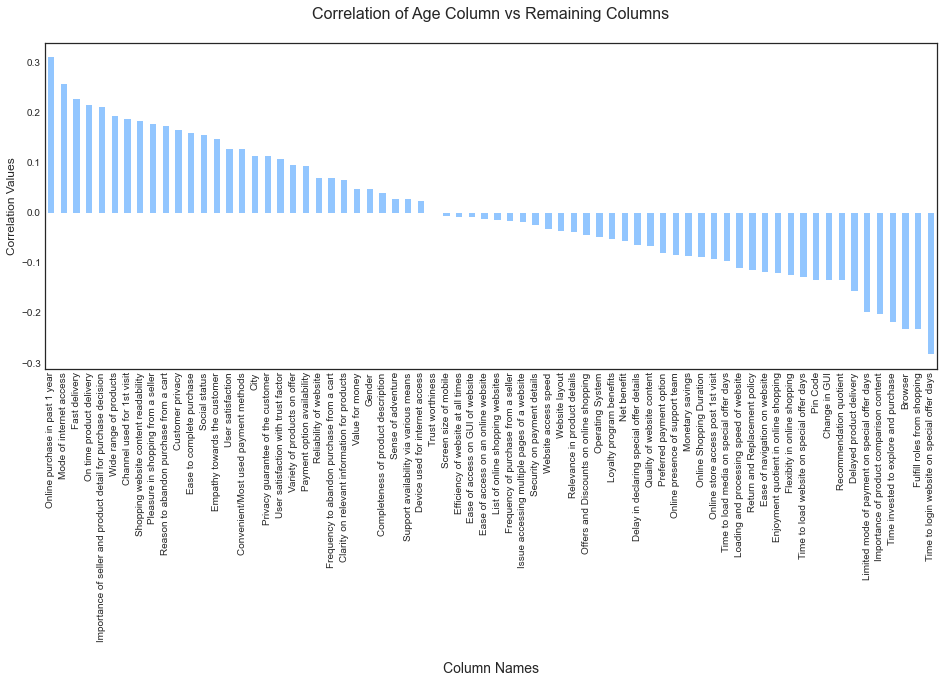

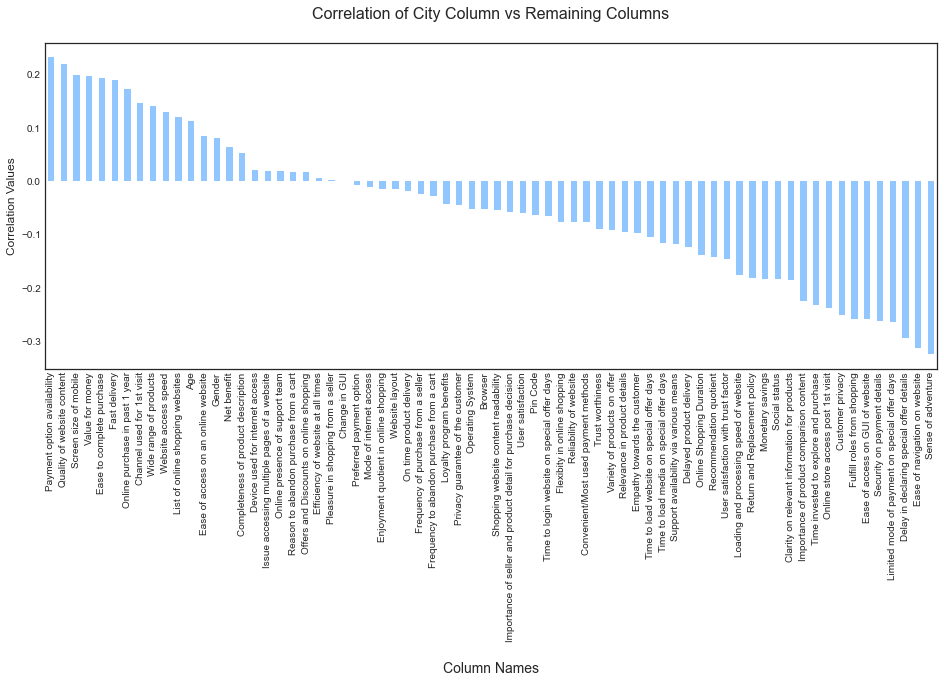

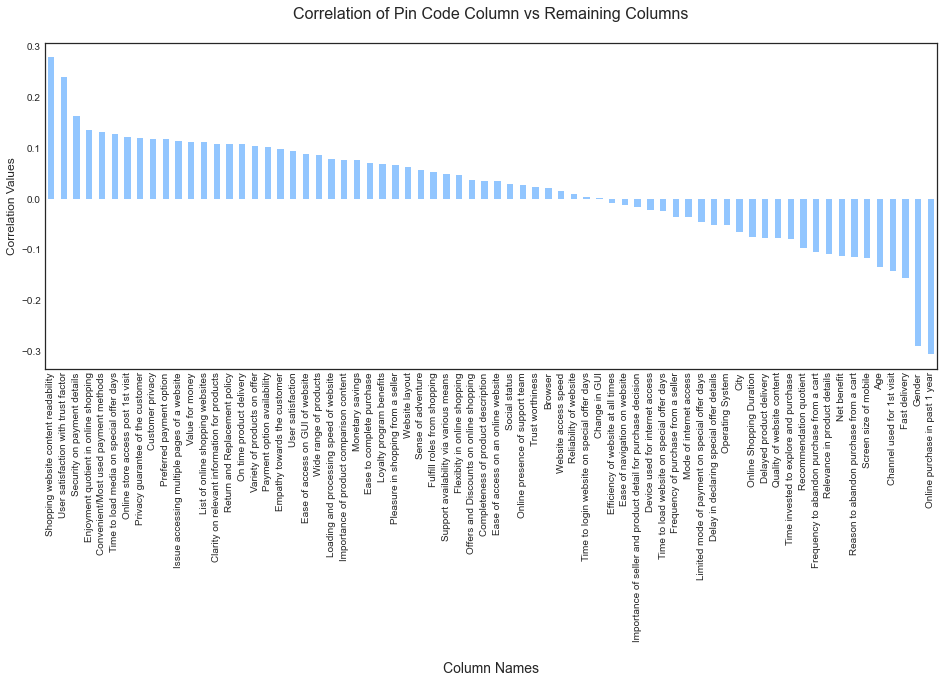

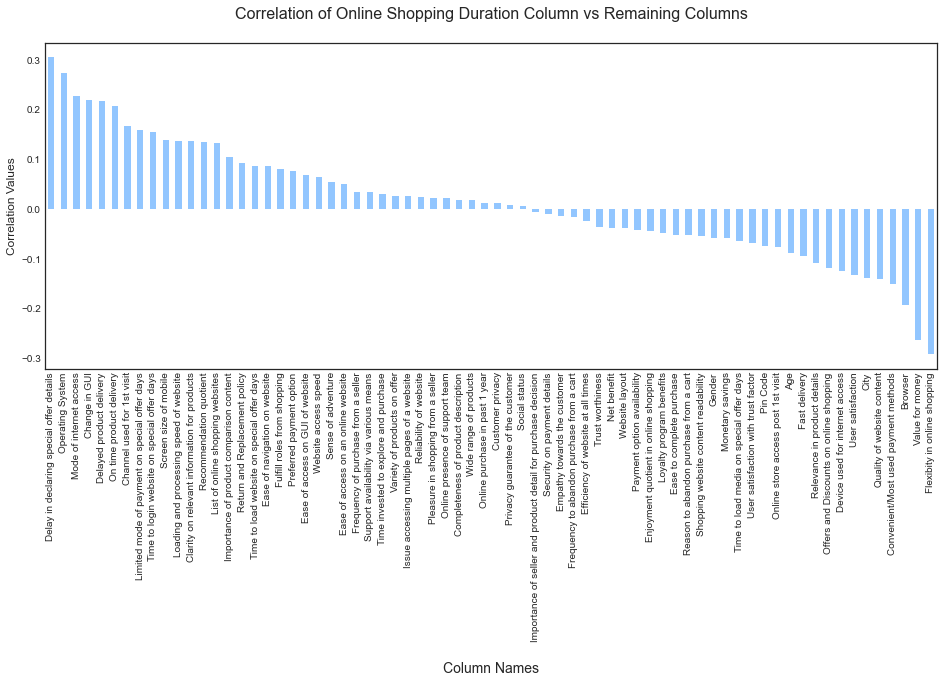

...

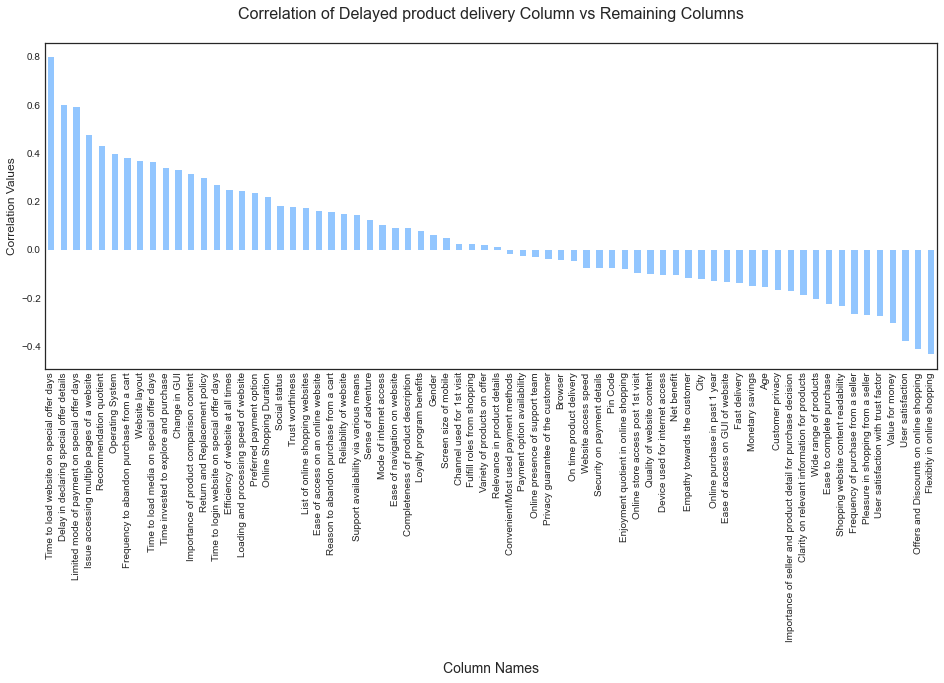

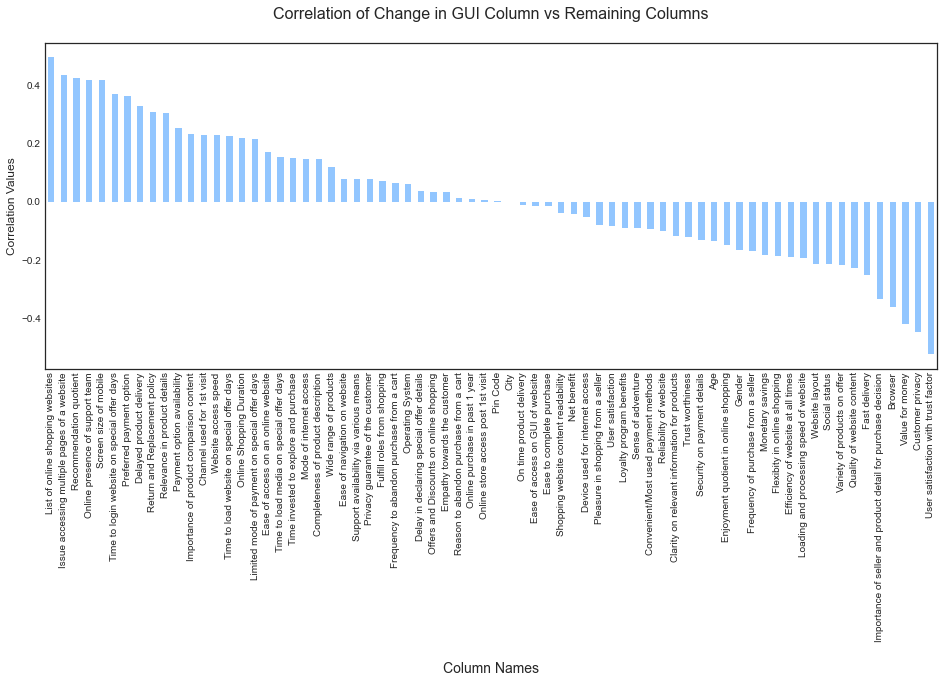

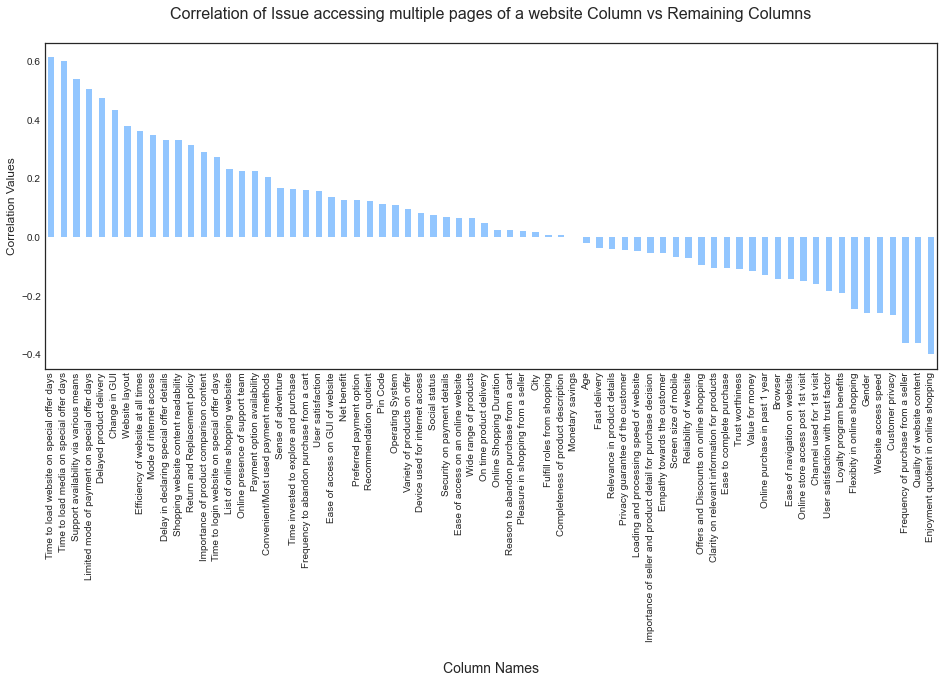

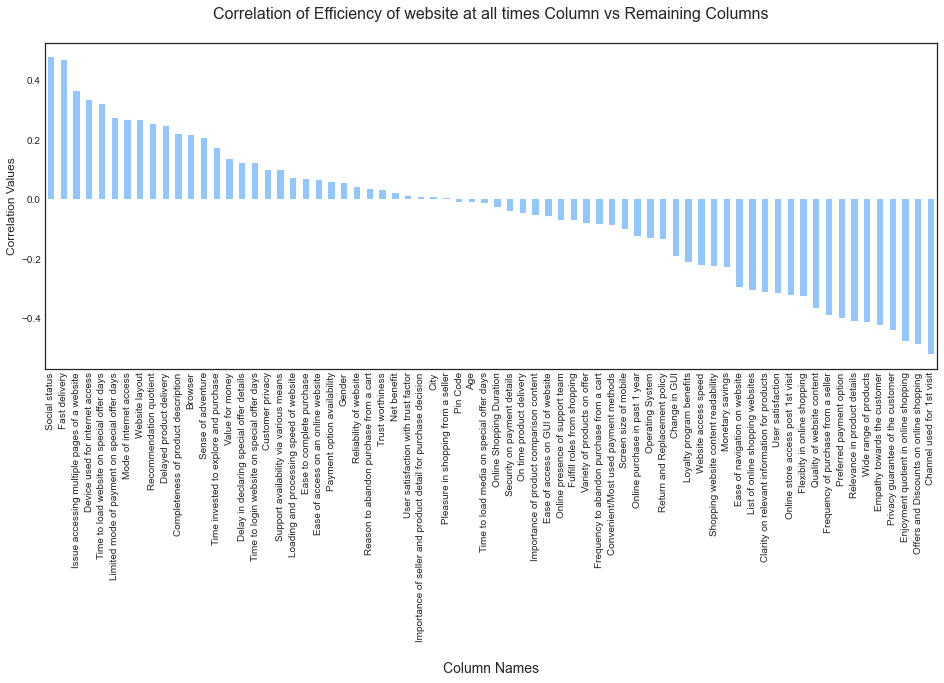

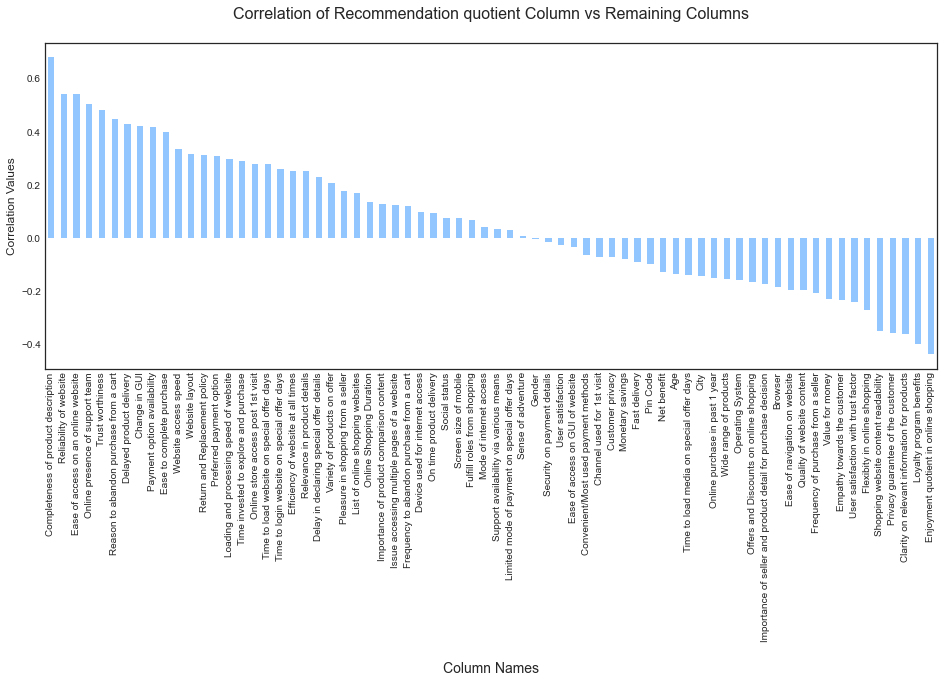

In [56]:
plt.style.use('seaborn-pastel')

column_names = df.columns
for col in df[column_names]:
    df_corr = df.corr()
    plt.figure(figsize=(16,6))
    df_corr[col].sort_values(ascending=False).drop(col).plot.bar()
    plt.title("Correlation of {} Column vs Remaining Columns\n".format(col), fontsize=16)
    plt.xlabel("\nColumn Names", fontsize=14)
    plt.ylabel("Correlation Values", fontsize=12)
    plt.show()